# Лабораторная работа №1. Дерево решений.

## Импортируем необходимые библиотеки

In [1]:
import graphviz  # визуализация дерева
import matplotlib.pyplot as plt  # визуализация
import pandas as pd  # работа с данными
import seaborn as sns  # визуализация матрицы корреляций

from sklearn.model_selection import train_test_split  # разделение на выборки
from sklearn.metrics import roc_auc_score, accuracy_score, f1_score  # метрики бинарной классификации
from sklearn.tree import DecisionTreeClassifier, export_graphviz  # дерево решений, функция визуализации ДР

In [2]:
import warnings  # избавляемся от варнингов
warnings.filterwarnings('ignore')

## Чтение, предобработка данных

### Для построения дерева решений в задаче бинарной классификации мы решили взять датасет, где на основе данных о людях, нужно предсказать зарабатывают ли они более 50 тысяч долларов в год

Структура датасета:  
14 атрибутов, целевая переменная `income`

- `age`: continuous.
- `workclass`: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
- `fnlwgt`: continuous.
- `education`: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
- `education-num`: continuous.
- `marital-status`: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- `occupation`: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- `relationship`: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
- `race`: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
- `sex`: Female, Male.
- `capital-gain`: continuous.
- `capital-loss`: continuous.
- `hours-per-week`: continuous.
- `native-country`: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.
- `income`: >50K, <=50K

Датасет взят с платформы Kaggle по [ссылке](https://www.kaggle.com/wenruliu/adult-income-dataset). На Kaggle он был размещен из [UCI репозитория](https://archive.ics.uci.edu/ml/datasets/adult) 

In [3]:
data = pd.read_csv('../data/adult.csv')

In [4]:
data.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [5]:
data.shape

(48842, 15)

In [6]:
data.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


### Проверяем, есть ли пропущенные значения (NaN)

In [7]:
data.isna().sum()

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital-status     0
occupation         0
relationship       0
race               0
gender             0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

### Предобрабатываем данные
- Переименуем значения категориальных переменных
- Преобразуем категориальные переменные в числовые с помощью one-hot encoding
- Разделяем на обучающую и тестовую выборки

In [8]:
data['income'] = data['income'].map({'<=50K': 0, '>50K': 1})
data['gender'] = data['gender'].map({'Male': 1, 'Female': 0})

In [9]:
X = pd.concat([data[['age', 'capital-gain', 'capital-loss', 'fnlwgt', 'educational-num', 'gender', 'hours-per-week']], 
               pd.get_dummies(data['workclass'], prefix='work'),
               pd.get_dummies(data['education'], prefix='education'),
               pd.get_dummies(data['marital-status'], prefix='marital_status'),
               pd.get_dummies(data['occupation'], prefix='job'),
               pd.get_dummies(data['relationship'], prefix='relationship'),
               pd.get_dummies(data['race'])], axis=1)
y = data['income']

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [11]:
X_train

,age,capital-gain,capital-loss,fnlwgt,educational-num,gender,hours-per-week,work_?,work_Federal-gov,work_Local-gov,...,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,Amer-Indian-Eskimo,Asian-Pac-Islander,Black,Other,White
10569,60,0,0,176360,13,1,40,0,0,0,...,0,0,0,0,0,0,0,0,0,1
19000,39,0,0,144169,9,1,50,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4525,26,4650,0,186454,13,1,40,0,0,0,...,1,0,0,0,0,0,1,0,0,0
35059,36,0,0,286115,9,1,40,0,0,0,...,0,0,0,0,0,0,0,0,0,1
514,34,0,0,105141,10,1,40,0,0,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,36,0,0,635913,9,1,40,0,0,0,...,1,0,0,0,0,0,0,1,0,0
44732,34,0,0,107624,10,1,50,0,0,0,...,0,0,0,0,0,0,0,0,0,1
38158,28,0,0,250135,10,0,40,0,0,0,...,1,0,0,0,0,0,0,0,0,1
860,46,0,0,96652,11,0,40,0,0,0,...,0,0,0,1,0,0,0,1,0,0


#### Какие признаки у нас получились

In [12]:
X_train.columns.to_list()

['age',
 'capital-gain',
 'capital-loss',
 'fnlwgt',
 'educational-num',
 'gender',
 'hours-per-week',
 'work_?',
 'work_Federal-gov',
 'work_Local-gov',
 'work_Never-worked',
 'work_Private',
 'work_Self-emp-inc',
 'work_Self-emp-not-inc',
 'work_State-gov',
 'work_Without-pay',
 'education_10th',
 'education_11th',
 'education_12th',
 'education_1st-4th',
 'education_5th-6th',
 'education_7th-8th',
 'education_9th',
 'education_Assoc-acdm',
 'education_Assoc-voc',
 'education_Bachelors',
 'education_Doctorate',
 'education_HS-grad',
 'education_Masters',
 'education_Preschool',
 'education_Prof-school',
 'education_Some-college',
 'marital_status_Divorced',
 'marital_status_Married-AF-spouse',
 'marital_status_Married-civ-spouse',
 'marital_status_Married-spouse-absent',
 'marital_status_Never-married',
 'marital_status_Separated',
 'marital_status_Widowed',
 'job_?',
 'job_Adm-clerical',
 'job_Armed-Forces',
 'job_Craft-repair',
 'job_Exec-managerial',
 'job_Farming-fishing',
 'job_

### Матрица коэффициентов корреляции

##### Стоит отметить, что у нас очень много категориальных признаков, что засоряет матрицу корреляций, так как корреляцию Пирсона интерееснее смотреть у непрерывных числовых наборов данных

In [89]:
# plt.figure(figsize=(60,30))
# sns.heatmap(X.corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1.0);

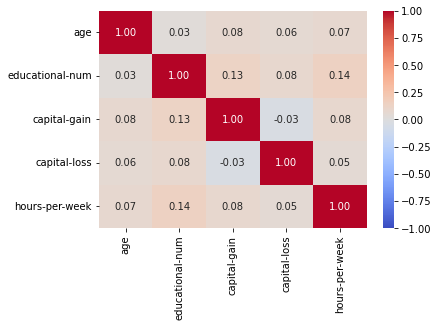

In [14]:
# plt.figure(figsize=(60,30))
sns.heatmap(data[['age', 'educational-num', 'capital-gain', 'capital-loss', 'hours-per-week']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1.0);


## Дисбаланс в классах

### На "трейне"

In [92]:
y_train.value_counts()

0    22252
1     7053
Name: income, dtype: int64

In [87]:
# В процентах
y_train.value_counts(normalize=True).round(2)

0    0.76
1    0.24
Name: income, dtype: float64

### На "тесте"

In [83]:
y_test.value_counts()

0    14903
1     4634
Name: income, dtype: int64

In [86]:
# В процентах
y_test.value_counts(normalize=True).round(2)

0    0.76
1    0.24
Name: income, dtype: float64

#### С "мапом"

In [93]:
y_train.map({0: '<=50K', 1: '>50K'}).value_counts()

<=50K    22252
>50K      7053
Name: income, dtype: int64

## Построение моделей дерева решений

### Дерево решений без ограничений

#### Обучение

In [15]:
%%time
initial_tree = DecisionTreeClassifier(random_state=42)
initial_tree.fit(X_train, y_train)

CPU times: user 250 ms, sys: 259 µs, total: 250 ms
Wall time: 248 ms


DecisionTreeClassifier(random_state=42)

#### Предсказание

In [16]:
initial_tree_predictions = initial_tree.predict(X_test)

#### Значение метрик

In [17]:
roc_auc_score(y_test, initial_tree_predictions)

0.7557744005393995

In [18]:
accuracy_score(y_test, initial_tree_predictions)

0.8171674259098122

In [19]:
f1_score(y_test, initial_tree_predictions)

0.6237623762376239

#### Визуализация дерева

##### Сохранение его в формате PNG, SVG

In [20]:
dot_data_of_tree = export_graphviz(initial_tree, feature_names=X_train.columns,  
                  class_names=['<=50K','>50K'],  
                  filled=True)
# graphviz.Source(dot_data_of_tree)

In [21]:
# export_graphviz(initial_tree, out_file='initial_tree.dot', 
#                 feature_names = X_test.columns,
#                 class_names = ['<=50K','>50K'],
#                 rounded = True, filled = True)

In [22]:
# Convert to png using system command
from subprocess import call
call(['dot', '-Tpng', 'initial_tree.dot', '-o', 'tree.png', '-Gdpi=600'])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0290095 to fit


0

In [23]:
# Convert to svg using system command (requires Graphviz)
call(['dot', '-Tsvg', 'initial_tree.dot', '-o', 'tree.svg', '-Gdpi=600'])

0

##### Само дерево

In [24]:
# Display in jupyter notebook
from IPython.display import Image, SVG
Image(filename = 'tree.png')

In [100]:
# graphviz.Source(dot_data_of_tree)

In [26]:
# SVG(filename = 'tree.svg')

##### Примеры узлов дерева решений
В каждом узле отображается:
- Наименование разделяющего признака
- Эвристика (в данном случае Gini Impurity)
- Количество наблюдений на входе в узел
- Количество наблюдений, относящихся к классам 0 и 1 соответсвенно [<= 50K, >50K]
- Превалирующий класс

Доп. факты про данную визуализацию дерева решений
- Узел окрашивается в оранжевый, если в нем больше наблюдений класса <=50K (класс 0), в синий, если в нём больше наблюдений класса >50K (класс 1)
- Насыщенность цвета зависит от превалирования одного из классов
- Слева от узла True, справа False

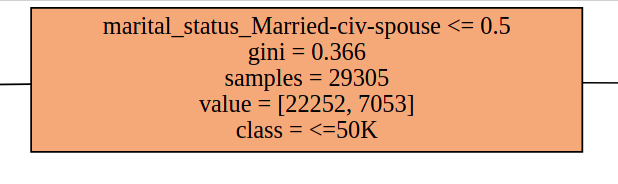

In [27]:
Image("dt_node_example.png")

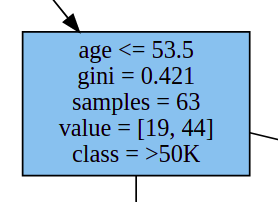

In [28]:
Image("dt_node_example_2.png")

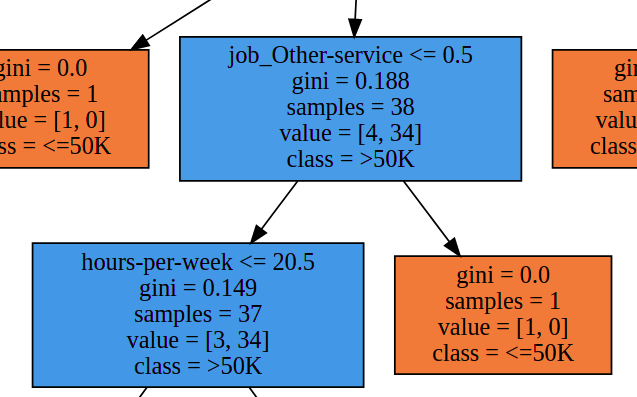

In [29]:
Image("dt_structure_example.png")

#### Важность признаков

In [30]:
len(X_test.columns)

65

##### У нас всего 65 признаков, выведем 15 самых важных

In [31]:
pd.DataFrame.from_dict({'feature': X_train.columns,
                        'importance': initial_tree.feature_importances_}) \
.sort_values('importance', ascending=False).iloc[:15]

,feature,importance
34,marital_status_Married-civ-spouse,0.196650
3,fnlwgt,0.194363
0,age,0.117137
4,educational-num,0.114484
1,capital-gain,0.103951
6,hours-per-week,0.067569
2,capital-loss,0.037981
11,work_Private,0.011574
43,job_Exec-managerial,0.010880
51,job_Sales,0.010109


### Дерево решений с ограничениями

#### Обучение

In [32]:
%%time
limit_tree = DecisionTreeClassifier(random_state=42, max_depth=5, max_features=15, min_samples_leaf=5)
# Макс. глубина = 5
# Макс. число признаков при поиске разделителя = 15
# Минимальное число наблюдений в листе = 5
limit_tree.fit(X_train, y_train)

CPU times: user 49 ms, sys: 2.73 ms, total: 51.7 ms
Wall time: 48.9 ms


DecisionTreeClassifier(max_depth=5, max_features=15, min_samples_leaf=5,
                       random_state=42)

#### Предсказане

In [33]:
limit_tree_predictions = limit_tree.predict(X_test)

#### Значение метрик

In [34]:
roc_auc_score(y_test, limit_tree_predictions)

0.6989860209820079

In [35]:
accuracy_score(y_test, limit_tree_predictions)

0.8285304806265036

In [36]:
f1_score(y_test, limit_tree_predictions)

0.5559384941675504

##### Для сравнения
Дерево без ограничений:
- ROC AUC: 0.7557744005393995
- Accuracy: 0.8171674259098122
- F1: 0.6237623762376239

#### Визуализация дерева

In [37]:
dot_data_of_limit_tree = export_graphviz(limit_tree, feature_names=X_train.columns,  
                  class_names=['<=50K','>50K'],  
                  filled=True)
# graphviz.Source(dot_data_of_tree)

In [38]:
# export_graphviz(limit_tree, out_file='limit_tree.dot', 
#                 feature_names = X_test.columns,
#                 class_names = ['<=50K','>50K'],
#                 rounded = True, filled = True)

In [39]:
call(['dot', '-Tpng', 'limit_tree.dot', '-o', 'limit_tree.png', '-Gdpi=600'])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.81756 to fit


0

In [40]:
call(['dot', '-Tsvg', 'limit_tree.dot', '-o', 'limit_tree.svg', '-Gdpi=600'])

0

In [88]:
# graphviz.Source(dot_data_of_limit_tree)

##### Само дерево

In [45]:
Image("limit_tree.png")

#### Важность признаков

##### Оень маленькое количество признаков будут иметь важность > 0, так как всего несколько признаков участвовали в построении дерева

In [46]:
pd.DataFrame.from_dict({'feature': X_train.columns,
                        'importance': limit_tree.feature_importances_}) \
.sort_values('importance', ascending=False).iloc[:15]

,feature,importance
34,marital_status_Married-civ-spouse,0.280096
4,educational-num,0.251386
6,hours-per-week,0.186007
54,relationship_Husband,0.073710
36,marital_status_Never-married,0.067339
1,capital-gain,0.049736
59,relationship_Wife,0.041203
0,age,0.027039
43,job_Exec-managerial,0.010532
27,education_HS-grad,0.005012
